In [2]:
%pip install torch torchvision segmentation-models-pytorch opencv-python matplotlib rasterio pyshp torchsummary patchify

Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
import torch
import numpy as np
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
import torch.optim as optim
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
# Directories
img_dir = "train/img"
mask_dir = "train/gt"
image_size = 256
num_epochs = 20
batch_size = 32

In [5]:
class SatelliteMask(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None):
        super(SatelliteMask, self).__init__()
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(img_dir)
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index):
        img_path = os.path.join(self.img_dir, self.images[index])
        mask_path = os.path.join(self.mask_dir, self.images[index])
        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32)
        mask[mask == 255.0] = 1.0
        
        if self.transform is not None:
            image = self.transform(image)
            mask = self.transform(mask)
        
        return image, mask

# Define the transform
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
])

In [6]:
dataset = SatelliteMask(img_dir=img_dir, mask_dir=mask_dir, transform=transform)

# Split the dataset into training, validation, and test sets
train_size = int(0.7 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size, shuffle=False)


Training Dataset:


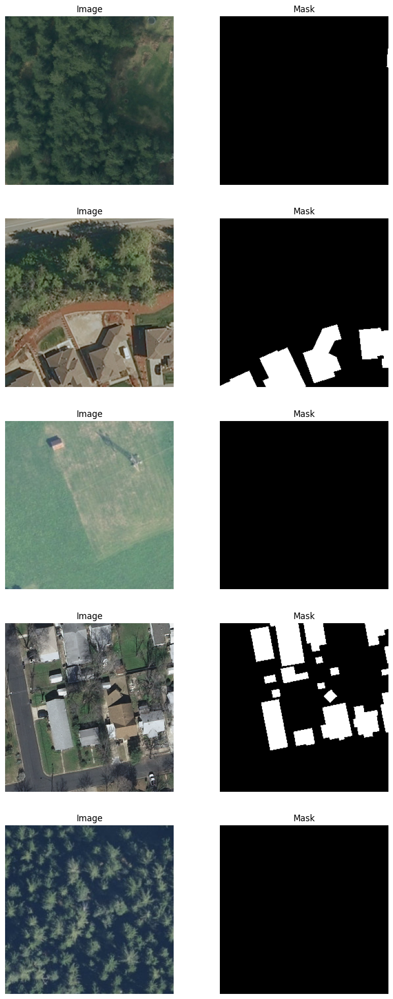

Validation Dataset:


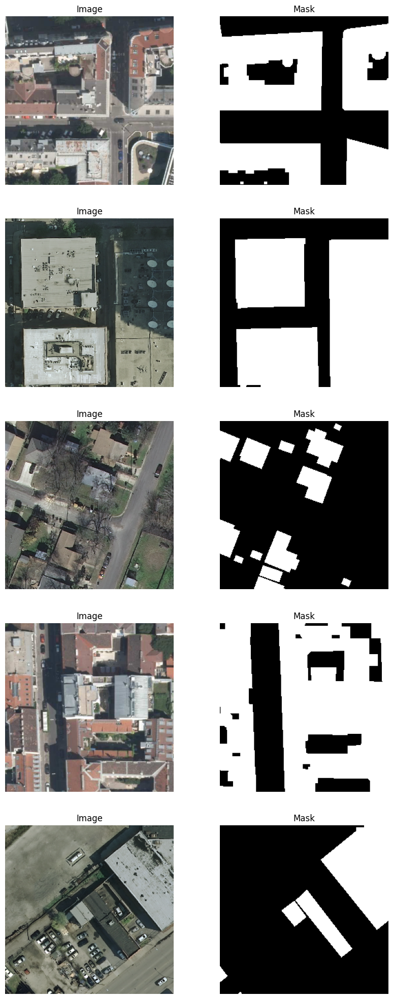

In [7]:
def show_images_with_masks(dataset, num_images=5):
    fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 5))
    for i in range(num_images):
        image, mask = dataset[i]
        image = transforms.ToPILImage()(image)
        mask = transforms.ToPILImage()(mask)
        
        axes[i, 0].imshow(image)
        axes[i, 0].set_title('Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title('Mask')
        axes[i, 1].axis('off')
    plt.show()

# Visualize the top 5 images with their masks from the training dataset
print("Training Dataset:")
show_images_with_masks(train_dataset)

# Visualize the top 5 images with their masks from the validation dataset
print("Validation Dataset:")
show_images_with_masks(val_dataset)

In [1]:
def visualize_predictions(model, dataloader, num_images=1, phase='Train'):
    model.eval()
    
    with torch.no_grad():
        for i, (x, y) in enumerate(dataloader):
            if i >= num_images:
                break
            x, y = x.to(device), y.to(device)
            predictions = torch.sigmoid(model(x))
            predictions = (predictions > 0.5).float()
            
            # Convert tensors to images properly
            image = transforms.ToPILImage()(x.cpu()[0])
            mask = transforms.ToPILImage()(y.cpu()[0].squeeze(0))
            pred = transforms.ToPILImage()(predictions.cpu()[0].squeeze(0))
    
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(image)
            axes[0].set_title(f'{phase} Image')
            axes[0].axis('off')

            axes[1].imshow(pred, cmap='gray')
            axes[1].set_title(f'{phase} Generated Mask')
            axes[1].axis('off')

            axes[2].imshow(mask, cmap='gray')
            axes[2].set_title(f'{phase} Actual Mask')
            axes[2].axis('off')
            plt.show()

# Training and evaluation functions
def train(model, dataloader, criterion, optimizer, device, scaler):
    model.train()
    epoch_loss = 0
    correct = 0
    total = 0

    for (x, y) in tqdm(dataloader, desc='Training', leave=False):
        x, y = x.to(device), y.to(device)
        
        optimizer.zero_grad()
        
        with torch.cuda.amp.autocast():
            predictions = model(x)
            loss = criterion(predictions, y)
        
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        epoch_loss += loss.item()
        
        preds = torch.sigmoid(predictions) > 0.5
        correct += (preds == y).sum().item()
        total += y.numel()
        
    accuracy = correct / total
    return epoch_loss / len(dataloader), accuracy

def evaluate(model, dataloader, criterion, device):
    model.eval()
    epoch_loss = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for (x, y) in tqdm(dataloader, desc='Evaluating', leave=False):
            x, y = x.to(device), y.to(device)
            
            predictions = model(x)
            loss = criterion(predictions, y)
            
            epoch_loss += loss.item()
            
            preds = torch.sigmoid(predictions) > 0.5
            correct += (preds == y).sum().item()
            total += y.numel()
            
    accuracy = correct / total
    return epoch_loss / len(dataloader), accuracy

# Initialize the model from segmentation_models_pytorch
model = smp.Unet(
    encoder_name="efficientnet-b0",        # Choose the backbone
    encoder_weights="imagenet",            # Use pre-trained weights
    in_channels=3,                         # Input channels (RGB)
    classes=1                              # Output classes (1 for binary segmentation)
).to(device)

# Initialize the optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Set the model to train mode
model.train()

criterion = nn.BCEWithLogitsLoss()
scaler = torch.cuda.amp.GradScaler()

for epoch in range(num_epochs):
    with tqdm(total=2, desc=f'Epoch {epoch+1}/{num_epochs}', position=0, leave=True) as pbar:
        train_loss, train_acc = train(model, train_loader, criterion, optimizer, device, scaler)
        pbar.update(1)
        val_loss, val_acc = evaluate(model, val_loader, criterion, device)
        pbar.update(1)
        
        print(f'Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}')
        print("Train Predictions:")
        visualize_predictions(model, train_loader, phase='Train', num_images=1)
        
        print("Validation Predictions:")
        visualize_predictions(model, val_loader, phase='Val', num_images=1)

In [ ]:
torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_acc': train_acc,
            'val_acc': val_acc,
        }, f'model_weight.pth')

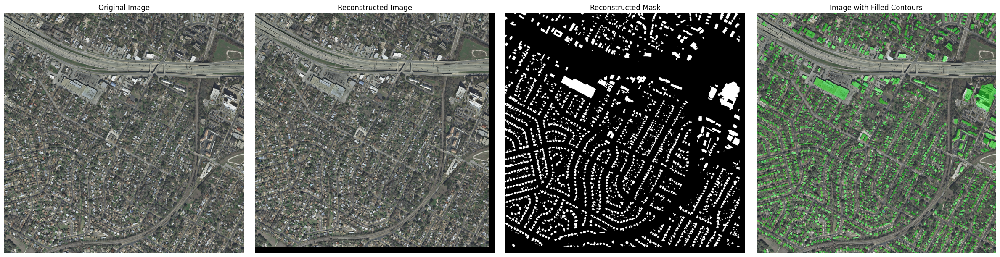

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms
import segmentation_models_pytorch as smp
import cv2

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the image size
image_size = 256

# Initialize the model from segmentation_models_pytorch
model = smp.Unet(
    encoder_name="efficientnet-b0",        # Choose the backbone
    encoder_weights="imagenet",            # Use pre-trained weights
    in_channels=3,                         # Input channels (RGB)
    classes=1                              # Output classes (1 for binary segmentation)
).to(device)

# Load the model checkpoint
checkpoint_path = 'model_weight.pth'  # Replace with your checkpoint path
checkpoint = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])

# Set the model to evaluation mode
model.eval()

# Define the transform for the new image
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
])

def pad_image(image, patch_size=(256, 256)):
    image_np = np.array(image)
    pad_height = (patch_size[0] - image_np.shape[0] % patch_size[0]) % patch_size[0]
    pad_width = (patch_size[1] - image_np.shape[1] % patch_size[1]) % patch_size[1]

    if pad_height > 0 or pad_width > 0:
        image_np = np.pad(image_np, ((0, pad_height), (0, pad_width), (0, 0)), mode='constant', constant_values=0)
    
    padded_image = Image.fromarray(image_np)
    return padded_image, image_np.shape

def create_patches(image, patch_size=(256, 256)):
    image_np = np.array(image)
    padded_image, padded_size = pad_image(image, patch_size)
    padded_image_np = np.array(padded_image)
    patches = []
    
    for i in range(0, padded_image_np.shape[0], patch_size[0]):
        for j in range(0, padded_image_np.shape[1], patch_size[1]):
            patch = padded_image_np[i:i + patch_size[0], j:j + patch_size[1]]
            patches.append((patch, i, j))

    return patches, padded_size

def preprocess_image(image_np):
    image = Image.fromarray(image_np)
    image = transform(image)
    image = image.unsqueeze(0)  # Add batch dimension
    return image.to(device)

def postprocess_output(output):
    output = torch.sigmoid(output)
    output = (output > 0.5).float()
    output = output.cpu().numpy().squeeze(0).squeeze(0)  # Remove batch and channel dimensions
    return output

def predict_patches(model, patches):
    predicted_masks = []
    for patch, i, j in patches:
        preprocessed_patch = preprocess_image(patch)
        with torch.no_grad():
            output = model(preprocessed_patch)
        mask = postprocess_output(output)
        predicted_masks.append((mask, i, j))
    return predicted_masks

def reconstruct_image(patches, image_size):
    reconstructed_image = np.zeros(image_size, dtype=np.uint8)
    for patch, i, j in patches:
        reconstructed_image[i:i + patch.shape[0], j:j + patch.shape[1], :] = patch
    return reconstructed_image

def reconstruct_mask(predicted_masks, padded_size):
    reconstructed_mask = np.zeros(padded_size[:2], dtype=np.float32)
    for mask, i, j in predicted_masks:
        reconstructed_mask[i:i + mask.shape[0], j:j + mask.shape[1]] = mask
    return reconstructed_mask

def draw_filled_contours_on_image(image, mask):
    image_np = np.array(image)
    mask = (mask * 255).astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    overlay = image_np.copy()
    cv2.drawContours(overlay, contours, -1, (0, 255, 0), -1)  # Filled contours
    
    alpha = 0.4  # Transparency factor
    cv2.addWeighted(overlay, alpha, image_np, 1 - alpha, 0, image_np)
    
    return image_np

def visualize_results(image_path, patches, predicted_masks, padded_size):
    original_image = Image.open(image_path).convert("RGB")
    reconstructed_image = reconstruct_image([(patch, i, j) for patch, i, j in patches], padded_size)
    reconstructed_mask = reconstruct_mask(predicted_masks, padded_size)
    image_with_filled_contours = draw_filled_contours_on_image(original_image, reconstructed_mask)
    
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    
    # Show original image
    axes[0].imshow(original_image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Show reconstructed image
    axes[1].imshow(reconstructed_image)
    axes[1].set_title('Reconstructed Image')
    axes[1].axis('off')

    # Show reconstructed mask
    axes[2].imshow(reconstructed_mask, cmap='gray')
    axes[2].set_title('Reconstructed Mask')
    axes[2].axis('off')

    # Show image with filled contours
    axes[3].imshow(image_with_filled_contours)
    axes[3].set_title('Image with Filled Contours')
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()

def main(image_path):
    image = Image.open(image_path).convert("RGB")
    patches, padded_size = create_patches(image, patch_size=(256, 256))
    predicted_masks = predict_patches(model, patches)
    visualize_results(image_path, patches, predicted_masks, padded_size)

# Test the script with an example image
test_image_path = '/media/usamah/2AAD843B4D4DD7CD/projects/SST/NEW2-AerialImageDataset/AerialImageDataset/train/images/austin1.tif'  # Replace with your test image path
main(test_image_path)


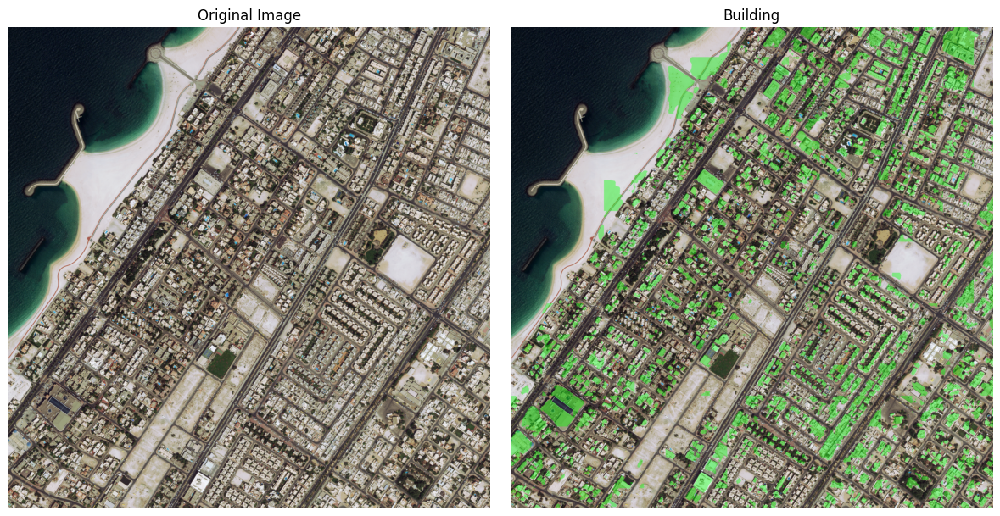

In [2]:
import os
import cv2
import rasterio
import shapefile
import torch
import numpy as np
from PIL import Image
import torch.nn as nn
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import segmentation_models_pytorch as smp


# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the image size
image_size = 256

# Initialize the model from segmentation_models_pytorch
model = smp.Unet(
    encoder_name="efficientnet-b0",        # Choose the backbone
    encoder_weights="imagenet",            # Use pre-trained weights
    in_channels=3,                         # Input channels (RGB)
    classes=1                              # Output classes (1 for binary segmentation)
).to(device)

# Load the model checkpoint
checkpoint_path = 'model_weight.pth'  # Replace with your checkpoint path
checkpoint = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])

# Set the model to evaluation mode
model.eval()

# Define the transform for the new image
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
])

def pad_image(image, patch_size=(256, 256)):
    image_np = np.array(image)
    pad_height = (patch_size[0] - image_np.shape[0] % patch_size[0]) % patch_size[0]
    pad_width = (patch_size[1] - image_np.shape[1] % patch_size[1]) % patch_size[1]

    if pad_height > 0 or pad_width > 0:
        image_np = np.pad(image_np, ((0, pad_height), (0, pad_width), (0, 0)), mode='constant', constant_values=0)
    
    padded_image = Image.fromarray(image_np)
    return padded_image, image_np.shape

def create_patches(image, patch_size=(256, 256)):
    image_np = np.array(image)
    padded_image, padded_size = pad_image(image, patch_size)
    padded_image_np = np.array(padded_image)
    patches = []
    
    for i in range(0, padded_image_np.shape[0], patch_size[0]):
        for j in range(0, padded_image_np.shape[1], patch_size[1]):
            patch = padded_image_np[i:i + patch_size[0], j:j + patch_size[1]]
            patches.append((patch, i, j))

    return patches, padded_size

def preprocess_image(image_np):
    image = Image.fromarray(image_np)
    image = transform(image)
    image = image.unsqueeze(0)  # Add batch dimension
    return image.to(device)

def postprocess_output(output):
    output = torch.sigmoid(output)
    output = (output > 0.5).float()
    output = output.cpu().numpy().squeeze(0).squeeze(0)  # Remove batch and channel dimensions
    return output

def predict_patches(model, patches):
    predicted_masks = []
    for patch, i, j in patches:
        preprocessed_patch = preprocess_image(patch)
        with torch.no_grad():
            output = model(preprocessed_patch)
        mask = postprocess_output(output)
        predicted_masks.append((mask, i, j))
    return predicted_masks

def reconstruct_image(patches, image_size):
    reconstructed_image = np.zeros(image_size, dtype=np.uint8)
    for patch, i, j in patches:
        reconstructed_image[i:i + patch.shape[0], j:j + patch.shape[1], :] = patch
    return reconstructed_image

def reconstruct_mask(predicted_masks, padded_size):
    reconstructed_mask = np.zeros(padded_size[:2], dtype=np.float32)
    for mask, i, j in predicted_masks:
        reconstructed_mask[i:i + mask.shape[0], j:j + mask.shape[1]] = mask
    return reconstructed_mask

def draw_filled_contours_on_image(image, mask):
    image_np = np.array(image)
    mask = (mask * 255).astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    overlay = image_np.copy()
    cv2.drawContours(overlay, contours, -1, (0, 255, 0), -1)  # Filled contours
    
    alpha = 0.4  # Transparency factor
    cv2.addWeighted(overlay, alpha, image_np, 1 - alpha, 0, image_np)
    
    return image_np, contours

def save_geotiff(image_with_contours, path):
    with rasterio.open(path, 'w', driver='GTiff', height=image_with_contours.shape[0], width=image_with_contours.shape[1], count=3, dtype=image_with_contours.dtype) as dst:
        for i in range(3):
            dst.write(image_with_contours[:, :, i], i + 1)

def save_shapefile(contours, path):
    with shapefile.Writer(path, shapefile.POLYGON) as shp:
        shp.field('name', 'C')
        for contour in contours:
            points = [tuple(point[0]) for point in contour]
            shp.poly([points])
            shp.record('polygon')

def visualize_and_save_results(image_path, patches, predicted_masks, padded_size, plot=True, save_plot=True, save_GeoTIFF=True, save_Shapefile=True):
    original_image = Image.open(image_path).convert("RGB")
    reconstructed_mask = reconstruct_mask(predicted_masks, padded_size)
    image_with_filled_contours, contours = draw_filled_contours_on_image(original_image, reconstructed_mask)
    
    if plot:
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        # Show original image
        axes[0].imshow(original_image)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        # Show image with filled contours
        axes[1].imshow(image_with_filled_contours)
        axes[1].set_title('Building')
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    if save_plot:
        save_path =  'highlighted.png'
        plt.imsave(save_path, image_with_filled_contours)
    
    if save_GeoTIFF:
        geotiff_path = os.path.splitext(image_path)[0] + 'contours.tif'
        save_geotiff(image_with_filled_contours, geotiff_path)
    
    if save_Shapefile:
        shapefile_path = os.path.splitext(image_path)[0] + '_contours'
        save_shapefile(contours, shapefile_path)

def main(image_path, plot=True, save_plot=True, save_GeoTIFF=True, save_Shapefile=True):
    image = Image.open(image_path).convert("RGB")
    patches, padded_size = create_patches(image, patch_size=(256, 256))
    predicted_masks = predict_patches(model, patches)
    visualize_and_save_results(image_path, patches, predicted_masks, padded_size, plot, save_plot, save_GeoTIFF, save_Shapefile)

# Test the script with an example image
test_image_path = 'Map_50cm.tif'  # Replace with your test image path
main(test_image_path, plot=True, save_plot=True, save_GeoTIFF=False, save_Shapefile=False)


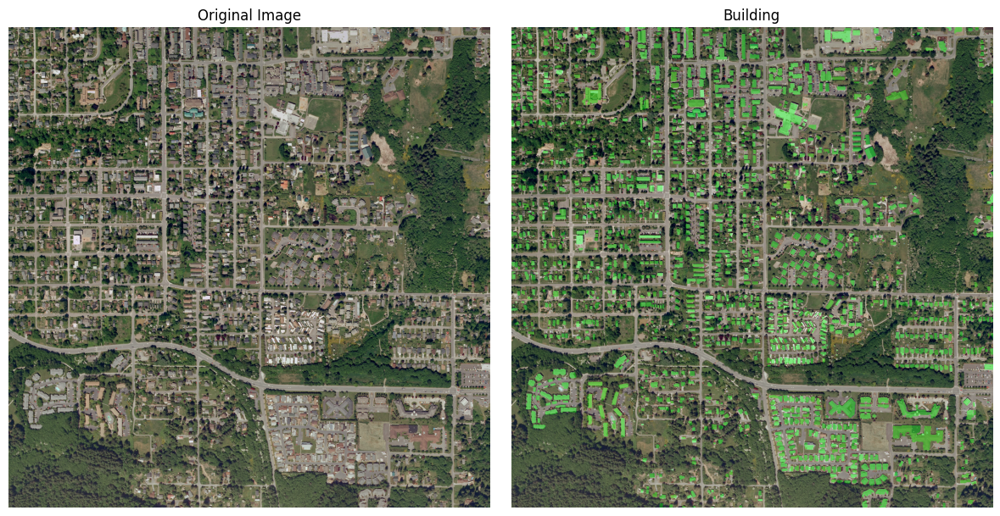

In [17]:
test_image_path = 'test/images/bellingham5.tif'  # Replace with your test image path
main(test_image_path, plot=True, save_plot=True, save_GeoTIFF=False, save_Shapefile=False)

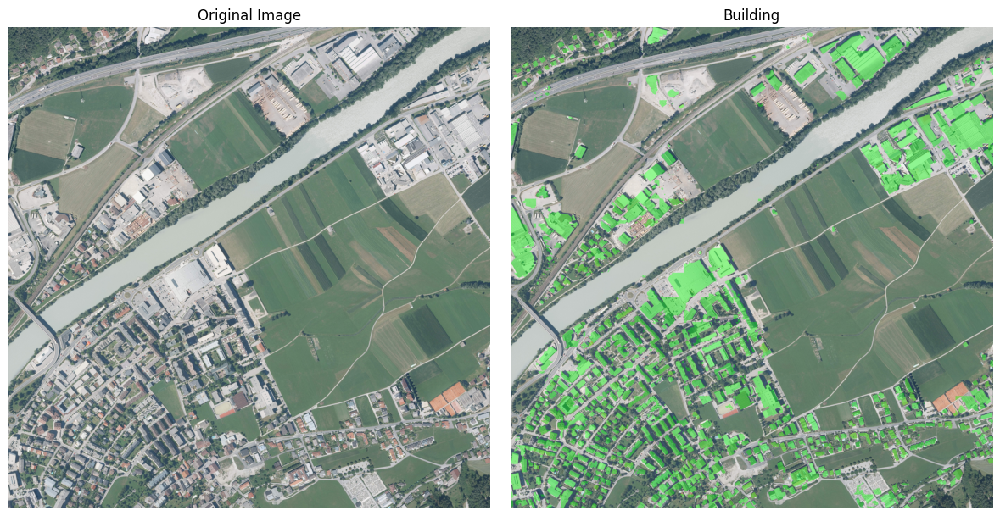

In [21]:
test_image_path = 'test/images/tyrol-e26.tif'  # Replace with your test image path
main(test_image_path, plot=True, save_plot=True, save_GeoTIFF=False, save_Shapefile=False)